In [178]:
%matplotlib inline
import matplotlib.pyplot as plt, IPython.display as ipd

import seaborn
seaborn.set(style='ticks')

from IPython.display import Audio

import numpy as np
import scipy

import librosa
import librosa.display

import glob


plt.rcParams['figure.figsize'] = (13, 5)

In [49]:
y, sr = librosa.load('/Users/kcfdaniel/Downloads/fyp/presentation.wav', sr= 44100)

In [50]:
Audio(data = y, rate = sr)

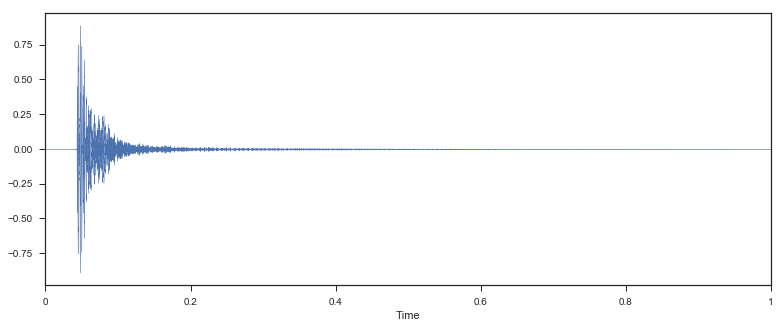

In [157]:
y = np.concatenate((y, np.zeros(20000)))
librosa.display.waveplot(y[0:22050], sr)

In [167]:
D = librosa.stft(y)

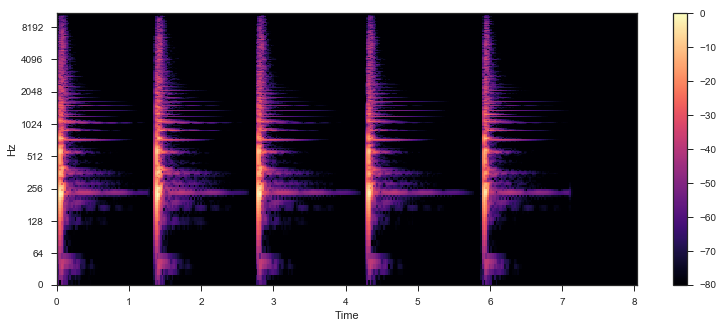

In [168]:
log_power = librosa.logamplitude(D**2, ref_power=np.max)
# librosa.display.specshow(log_power, x_axis='time', y_axis='linear')
librosa.display.specshow(log_power, x_axis='time', y_axis='log')
plt.colorbar()

In [177]:
# C = librosa.cqt(y, sr)
C = librosa.cqt(y[900:22950], bins_per_octave = 13, n_bins=100)

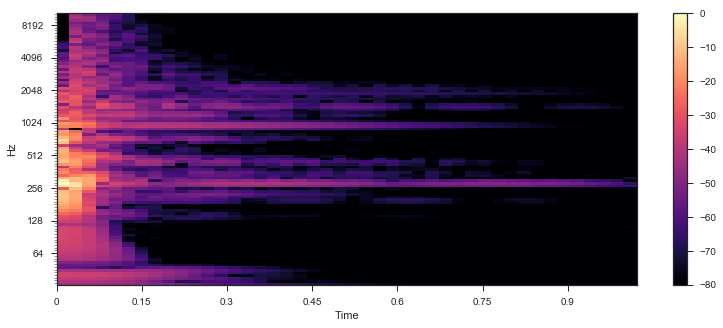

In [178]:
# librosa.display.specshow(librosa.logamplitude(C**2), x_axis='time', y_axis='cqt_hz')
# librosa.display.specshow(librosa.logamplitude(C**2, top_db=40), x_axis='time', y_axis='cqt_hz')
librosa.display.specshow(librosa.amplitude_to_db(C, ref=np.max), sr=sr, x_axis='time', y_axis='cqt_hz')
plt.colorbar()

In [9]:
chroma = librosa.feature.chroma_cqt(C=C, sr=sr)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/librosa/display.py:657: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


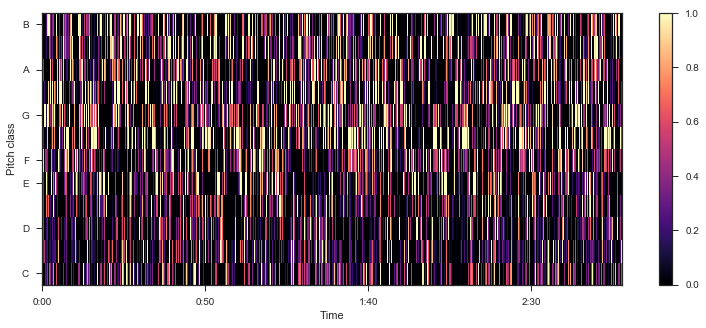

In [10]:
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma')
plt.colorbar()

In [51]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [47]:
Audio(data=y, rate=sr)

In [109]:
Audio(data=y_harmonic, rate=sr)

In [110]:
Audio(data=y_percussive, rate=sr)

In [52]:
librosa.output.write_wav('/Users/kcfdaniel/Downloads/fyp/presentation_percussive.wav', y_percussive, sr)

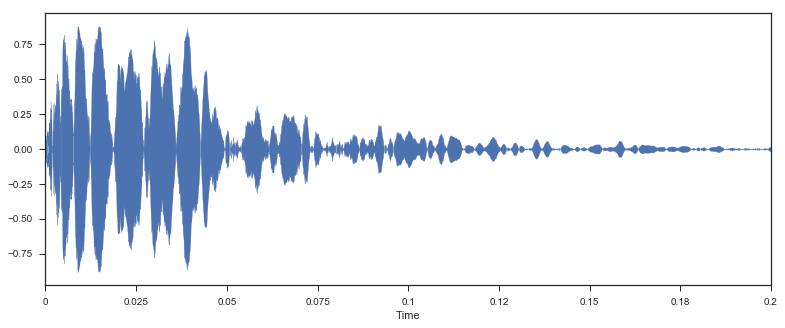

In [83]:
librosa.display.waveplot(y_percussive[91000:95410], sr)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/librosa/display.py:657: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


(<matplotlib.axes._subplots.AxesSubplot at 0x1268f1ac8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1268f1ac8>)

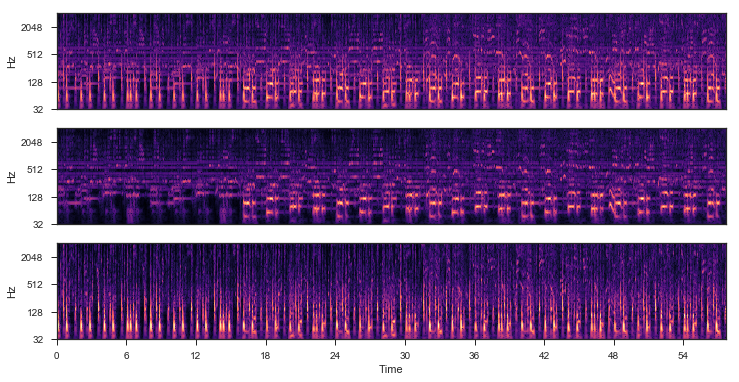

In [91]:
C_harmonic = librosa.cqt(y_harmonic, sr)
C_perc = librosa.cqt(y_percussive, sr)

plt.figure(figsize=(12,6))
plt.subplot(3,1,1), librosa.display.specshow(C**(1./3), y_axis='cqt_hz'),
plt.subplot(3,1,2), librosa.display.specshow(C_harmonic**(1./3), y_axis='cqt_hz'),
plt.subplot(3,1,3), librosa.display.specshow(C_perc**(1./3), y_axis='cqt_hz', x_axis='time'),


In [6]:
onset_envelope = librosa.onset.onset_strength(y_percussive, sr)
onsets = librosa.onset.onset_detect(onset_envelope=onset_envelope)

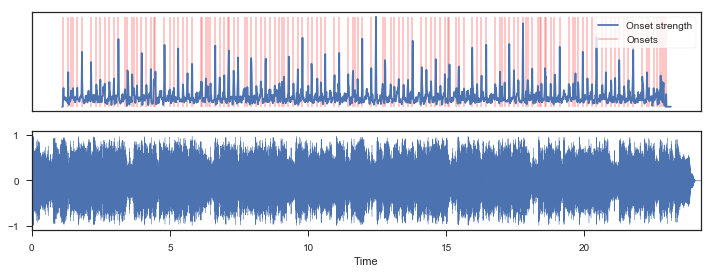

In [7]:
plt.figure(figsize=(12,4))
plt.subplot(2,1,1)
plt.plot(onset_envelope, label='Onset strength')
plt.vlines(onsets, 0, onset_envelope.max(), color='r', alpha=0.25, label='Onsets')
plt.xticks([]), plt.yticks([])
plt.legend(frameon=True)
plt.axis('tight')

plt.subplot(2,1,2)
librosa.display.waveplot(y, sr)

In [87]:
# tempo, beats = librosa.beat.beat_track(onset_envelope=onset_envelope)
# tempo = librosa.beat.tempo(y, sr=sr)
tempo = librosa.beat.tempo(y_percussive, sr=sr)

In [88]:
print(tempo)
# should be 130 for librosa.util.example_audio_file()

[ 117.45383523]


In [193]:
T = len(y)/float(sr)
seconds_per_beat = 60.0/tempo[0]
beat_times = np.arange(0, T, seconds_per_beat)

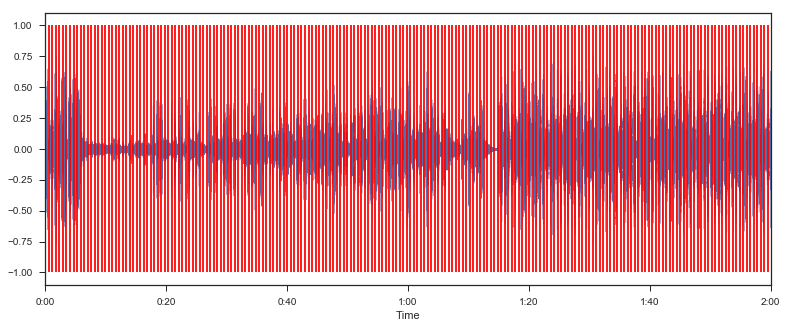

In [194]:
librosa.display.waveplot(y_percussive)
plt.vlines(beat_times, -1, 1, color='r')

In [91]:
clicks = librosa.clicks(beat_times, sr, length=len(y))
Audio(y_percussive + clicks, rate=sr)

NameError: name 'beat_times' is not defined

In [189]:
librosa.output.write_wav('y_percussive.wav', y_percussive, sr)

In [221]:
###seperate segments in songs
pathname = "/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第六首/y_percussive.wav" #########
filepaths = glob.glob(pathname)
file = filepaths[0]



y, sr = librosa.load(file, sr = 44100)
# Audio(data = y, rate = sr)

tempo = tempos[17]  ###########################
subdivision = subdivisions[17]
folder_name = "Drums Rockschool Data/Drums Grade 2/Song18_Y'All" ############
segment_length = 8820
hop_size = (int)(60*44100*4/(tempo*subdivision))

index = 1
current_position = 0

while current_position <= (len(y) - hop_size):
    librosa.output.write_wav("../" + folder_name + "/" + str(index) + ".wav", y[current_position: current_position+segment_length], sr)
    index = index + 1
    current_position = current_position + hop_size

In [210]:
y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第二首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第二首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第三首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第三首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第四首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第四首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第五首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第五首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第六首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第六首/y_percussive.wav', y_percussive, sr)






y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第一首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第一首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第二首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第二首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第三首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第三首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第四首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第四首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第五首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第五首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第六首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（1）示范+伴奏/第六首/y_percussive.wav', y_percussive, sr)





y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第一首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第一首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第二首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第二首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第三首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第三首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第四首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第四首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第五首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第五首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第六首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（2）示范+伴奏/第六首/y_percussive.wav', y_percussive, sr)




y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第一首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第一首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第二首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第二首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第三首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第三首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第四首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第四首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第五首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第五首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第六首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（3）示范+伴奏/第六首/y_percussive.wav', y_percussive, sr)




y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第一首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第一首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第二首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第二首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第三首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第三首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第四首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第四首/y_percussive.wav', y_percussive, sr)

y, sr = librosa.load('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第五首/y_percussive.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
y_percussive = librosa.to_mono(y_percussive)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（4）示范+伴奏/第五首/y_percussive.wav', y_percussive, sr)



In [213]:
text_file = open("/Users/kcfdaniel/Downloads/Drums Rockschool Data/dir.txt", "r")
directories = text_file.read().split('\n')
# print(len(directories))
# for line in directories:
#     print(line)
text_file.close()

text_file = open("/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/y_percussive.txt", "r")
y_percussives = text_file.read().split('\n')
# print(len(y_percussives))
# for line in y_percussives:
#     print(line)
text_file.close()

text_file = open("/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/tempo.txt", "r")
tempos = text_file.read().split('\n')
tempos = list(map(int, tempos))
# print(len(tempos))
# for line in tempos:
#     print(line)
text_file.close()

text_file = open("/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/subdivision.txt", "r")
subdivisions = text_file.read().split('\n')
subdivisions = list(map(int, subdivisions))
# print(len(subdivisions))
# for line in subdivisions:
#     print(line)
text_file.close()

In [214]:
for i in range(29):
    ###seperate segments in songs
    pathname = y_percussives[i] #########
    filepaths = glob.glob(pathname)
    file = filepaths[0]



    y, sr = librosa.load(file, sr = 44100)
    # Audio(data = y, rate = sr)

    tempo = tempos[i]  ###########################
    subdivision = subdivisions[i]     #####12 = 8th shuffle
    folder_name = directories[i] ############
    segment_length = 8820
    hop_size = (int)(60*44100*4/(tempo*subdivision))

    index = 1
    current_position = 0

    while current_position <= (len(y) - hop_size):
        librosa.output.write_wav("../" + folder_name + "/" + str(index) + ".wav", y[current_position: current_position+segment_length], sr)
        index = index + 1
        current_position = current_position + hop_size

In [199]:
pathname = y_percussives[0]
filepaths = glob.glob(pathname)
print(y_percussives[0])

pathname = "/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav" #########
filepaths = glob.glob("/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav")
file = filepaths[0]
print(pathname)

"/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav"
/Users/kcfdaniel/Downloads/英国皇家音乐学院架子鼓教材/英国皇家音乐学院架子鼓（预备）示范伴奏/第一首/y_percussive.wav
asdasd


In [134]:
from keras.models import load_model

# transfered model
models=[load_model("/Users/kcfdaniel/Downloads/fyp/final_model1.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model2.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model3.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model5.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model6.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model8.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model10.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model11.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model15_binary_crossentropy.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model16_binary_crossentropy.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model17_binary_crossentropy_augment_dirty.h5"),
        load_model("/Users/kcfdaniel/Downloads/fyp/final_model18_binary_crossentropy_augment_dirty.h5"),
        ]

In [ ]:
## FEATURE EXTRACTION

import seaborn
import numpy as np, scipy, matplotlib.pyplot as plt, sklearn, librosa, urllib, IPython.display
from IPython.display import Audio
# import stanford_mir_ver2
from numpy import array
import tflearn
import tensorflow as tf
import glob


########## stanford mir ver2  ############


import errno
import os
import os.path
import glob
import librosa.display
import numpy as np
from numpy import array
import soundfile as sf


def extract_features(signal, features):
    #get CQT
    fvs = list()
    
    if len(np.shape(signal)) == 2:
        signal = signal.T
        signal = librosa.to_mono(signal)
    
    result = librosa.cqt(signal, sr = 44100, bins_per_octave = 12, n_bins=109)
    
    ######    slice to first n time slices   #####
    temp=[]
#     print(np.shape(result))
    for i in result:
        temp.append(i[:18])
    result = array(temp)
        
    
    fvs.append( result )
    return fvs

In [231]:
##extract percussive
y, sr = librosa.load('/Users/kcfdaniel/Downloads/fyp/presentation.wav', sr= 44100)
y_harmonic, y_percussive = librosa.effects.hpss(y)
librosa.output.write_wav('/Users/kcfdaniel/Downloads/fyp/presentation_percussive.wav', y_percussive, sr)

##separate song according to onset
x, sr = librosa.load('/Users/kcfdaniel/Downloads/fyp/presentation_percussive.wav', sr =44100 )
print (x.shape, sr)
hop_length = 512
onset_frames = librosa.onset.onset_detect(x, sr=sr, hop_length=hop_length, backtrack=True)
onset_times = librosa.frames_to_time(onset_frames, sr=sr, hop_length=hop_length)
onset_samples = librosa.frames_to_samples(onset_frames, hop_length=hop_length)

segment_length = 8820

# every 16th note, 8067 samples

(2205575,) 44100


In [232]:
# print(onset_samples)
clicks = librosa.clicks(frames=onset_frames, sr=sr, length=len(x))
ipd.Audio(x, rate=sr)
# ipd.Audio(x + clicks, rate=sr)

In [233]:
for i in onset_samples:
    librosa.output.write_wav("/Users/kcfdaniel/Downloads/fyp/presentation_data/" + str(i) + ".wav", x[i: i+segment_length], sr)
    

In [234]:
##extract CQT out of presentation data
filepaths = glob.glob("/Users/kcfdaniel/Downloads/fyp/presentation_data/*.wav")


temp = []
signals=[]
for p in filepaths:
    data, samplerate = librosa.load(p, sr = 44100)
    if samplerate != 44100:
        print(p)
        temp.append(samplerate)
    signals.append(data)

    
features = np.array([extract_features(x, 'cqt') for x in signals])

features = np.reshape(features, [np.shape(features)[0],np.shape(features)[2],np.shape(features)[3]])

np.save('/Users/kcfdaniel/Downloads/fyp/presentation_features.npy',features)
np.save('/Users/kcfdaniel/Downloads/fyp/presentation_filepaths.npy',filepaths)

In [235]:
test_features = np.load("/Users/kcfdaniel/Downloads/fyp/presentation_features.npy")
test_filepaths = np.load("/Users/kcfdaniel/Downloads/fyp/presentation_filepaths.npy")
test_predictions = [model.predict(test_features) for model in models]
test_predictions = np.array(test_predictions)
test_predictions_copy = test_predictions
test_predictions_copy=np.delete(test_predictions_copy,0,0)
test_prediction = np.sum(test_predictions_copy, axis = 0)
test_prediction = test_prediction/np.shape(test_predictions_copy)[0]
test_prediction = test_prediction.tolist()
temp = []
for i in test_prediction:
    temp.append([round(element, 0) for element in i])
test_prediction = temp

np.save('/Users/kcfdaniel/Downloads/fyp/presentation_prediction.npy',test_prediction)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [254]:
## get predictions
predictions = np.load("/Users/kcfdaniel/Downloads/fyp/libai_prediction.npy")
filepaths = np.load("/Users/kcfdaniel/Downloads/fyp/libai_filepaths.npy")
filepaths = np.array([[int(i.split(".")[0].split("/")[6]) for i in filepaths]])

print(np.shape(predictions))
print(np.shape(filepaths))
filepaths_prediction = np.concatenate((predictions, filepaths.T), axis=1)

filepaths_prediction = sorted(filepaths_prediction,key=lambda x: x[4])

print(np.shape(predictions))
print(np.shape(onset_samples))
pathname = "/Users/kcfdaniel/Downloads/fyp/presentation_data/*" #########

print(np.shape(filepaths))
# filepaths = np.sort(filepaths)

    
# filepaths = np.sort(filepaths)

# for i in range(len(onset_samples)):
#     if onset_samples[i] != filepaths[i]:
#         print(i)
#         print(onset_samples[i])
#         print(filepaths[i])


# for i in filepaths_prediction:
#     for j in i:
#         print('%f'%(j), end='');
#         print('\t', end='');
#     print()


offset = 6144
previous_frame = -offset
hit = False

for i in filepaths_prediction:
    hit = False
#     print(i[4])
#     print(previous_frame + offset)
    if i[4] > (previous_frame + offset):
#         print("in!")
#         print()
        if i[0] == 1:
            print(str(i[4]) +'\t'+"0.125")
            hit = True
        if i[1] == 1:
            print(str(i[4]) +'\t'+"0.375")
            hit = True
        if i[2] == 1 and i[3] == 0:
            print(str(i[4]) +'\t'+"0.625")
            hit = True
        if i[3] == 1:
            print(str(i[4]) +'\t'+"0.875")
            hit = True
    if hit:
        previous_frame = i[4];
        
    

(101, 4)
(1, 101)
(101, 4)
(268,)
(1, 101)
3584.0	0.625
15360.0	0.625
38400.0	0.125
38400.0	0.625
62464.0	0.375
62464.0	0.625
74240.0	0.625
86016.0	0.125
86016.0	0.625
97792.0	0.125
97792.0	0.625
108544.0	0.375
108544.0	0.625
119808.0	0.625
132608.0	0.125
132608.0	0.625
143360.0	0.625
154624.0	0.375
154624.0	0.625
167424.0	0.625
177664.0	0.125
177664.0	0.625
189440.0	0.125
189440.0	0.625
200704.0	0.375
200704.0	0.625
212480.0	0.625
223744.0	0.125
223744.0	0.625
236032.0	0.625
246784.0	0.375
246784.0	0.625
259072.0	0.625
269824.0	0.125
269824.0	0.625
281088.0	0.125
281088.0	0.625
293376.0	0.375
293376.0	0.625
304640.0	0.625
315904.0	0.125
315904.0	0.625
328192.0	0.625
338944.0	0.375
338944.0	0.625
351232.0	0.625
361984.0	0.125
361984.0	0.625
373248.0	0.125
373248.0	0.625
385024.0	0.375
385024.0	0.625
397824.0	0.625
408576.0	0.125
408576.0	0.625
420352.0	0.625
431104.0	0.375
431104.0	0.625
442368.0	0.625
454656.0	0.125
454656.0	0.625
465920.0	0.125
465920.0	0.625
476160.0	0.375
476160.0	

In [255]:
for i in range(len(onset_samples)):
    if onset_samples[i] == 408576:
        print(onset_times[i])
